# The battle of neighbors project
## My target city is **Kaohsiung city(高雄市)**, which is the second large city of **Taiwan**.
## My object is to find the **best locations** in this city to **open a low GI food restaurant**.

# Import necessary libs

In [93]:
!pip install geopy
!pip uninstall folium -y
!pip install folium
!pip install bs4

import pandas as pd
import numpy as np
import requests
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
geolocator = Nominatim(user_agent="to_explorer")
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors



from bs4 import BeautifulSoup
#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
from tqdm import tqdm
import re

print('Libraries imported.')

Uninstalling folium-0.12.1:
  Successfully uninstalled folium-0.12.1
  Using cached https://files.pythonhosted.org/packages/c3/83/e8cb37afc2f016a1cf4caab8d22caf7fe4156c4c15230d8abc9c83547e0c/folium-0.12.1-py2.py3-none-any.whl
Libraries imported.


## I scraped districts/neighborhoods information of **Kaohsiung city** from **wikipedia**

In [94]:
# 高雄市-區-里
url = 'https://zh.wikipedia.org/wiki/%E4%B8%AD%E8%8F%AF%E6%B0%91%E5%9C%8B%E6%9D%91%E9%87%8C%E5%88%97%E8%A1%A8#%E9%AB%98%E9%9B%84%E5%B8%82'
headers = {'User-Agent': 'Mozilla/5.0 (X11; Linux x86_64) '\
           'AppleWebKit/537.36 (KHTML, like Gecko) '\
           'Chrome/75.0.3770.80 Safari/537.36'}

source = requests.get(url, headers=headers).text

soup = BeautifulSoup(source, 'html5lib')

tables = soup.find_all('table')
        
import re

rows = tables[18].find_all('tr') + tables[19].find_all('tr')
dict_dn_kh = {}

cur_d = None
for i_r in range(len(rows)):
    cells = rows[i_r].find_all('td')
    for i_c in range(len(cells)):
        for each_line in cells[i_c].text.split('\n'):
            if each_line == '':
                continue
            if '：' in each_line:
                if len(each_line) > 0 and '（續）' not in each_line:
                    cur_d = each_line.strip().replace('：', '')
                    if cur_d != '':
                        dict_dn_kh[cur_d] = []
            else:
                dict_dn_kh[cur_d].append(re.sub('\（.+\）', '', each_line.strip()))
count_d = 0
count_n = 0
for d, ns in dict_dn_kh.items():
    count_d += 1
    count_n += len(ns)
print('Kaohsiung city has [%d] districts and [%d] neighborhoods\n%s' % (count_d, count_n, str(dict_dn_kh)))

Kaohsiung city has [38] districts and [856] neighborhoods
{'楠梓區': ['清豐里', '東寧里', '五常里', '享平里', '中陽里', '惠楠里', '惠民里', '惠豐里', '錦屏里', '玉屏里', '金田里', '稔田里', '瑞屏里', '翠屏里', '宏南里', '宏毅里', '宏榮里', '廣昌里', '久昌里', '大昌里', '福昌里', '盛昌里', '泰昌里', '興昌里', '建昌里', '宏昌里', '和昌里', '慶昌里', '隆昌里', '秀昌里', '裕昌里', '國昌里', '加昌里', '仁昌里', '藍田里', '中興里', '中和里'], '左營區': ['進學里', '尾西里', '頂北里', '中北里', '中南里', '廟東里', '廟北里', '尾南里', '尾北里', '屏山里', '祥和里', '永清里', '復興里', '莒光里', '光輝里', '合群里', '明建里', '頂西里', '聖后里', '聖西里', '聖南里', '城南里', '路東里', '廍北里', '廍南里', '埤西里', '埤北里', '埤東里', '海勝里', '崇實里', '自助里', '果貿里', '果惠里', '果峰里', '新下里', '新上里', '新中里', '新光里', '菜公里', '福山里'], '三民區': ['鼎金里', '鼎盛里', '鼎強里', '鼎力里', '鼎西里', '鼎中里', '鼎泰里', '本館里', '本和里', '本文里', '本武里', '本元里', '本安里', '本上里', '本揚里', '寶獅里', '寶德里', '寶泰里', '寶興里', '寶中里', '寶華里', '寶國里', '寶民里', '寶慶里', '寶業里', '寶盛里', '寶安里', '寶龍里', '寶珠里', '寶玉里', '灣子里', '灣愛里', '灣中里', '灣華里', '灣勝里', '灣利里', '灣復里', '灣興里', '灣成里', '正興里', '正順里', '安康里', '安寧里', '安吉里', '安發里', '安東里', '安和里', '達德里', '達明里', '達仁里', '達勇里', '同德里', '德智里', '德仁里'

## Get latitude/longitude information of each district/neighborhood by **geolocator**

In [95]:
try:
    df_location_d = pd.read_csv('Locations_Districts.csv')
    df_location_dn = pd.read_csv('Locations_DistrictsNeighborhoods.csv')
    df_location_dn['DNs'] = df_location_dn['Districts'] + df_location_dn['Neighborhoods']

except:
    address = '高雄市, 台灣'
    location_d = {'Districts':[], 'lat':[], 'lng':[]}
    location_dn = {'Districts':[], 'Neighborhoods':[], 'lat':[], 'lng':[]}

    for district, neighborhoods in tqdm(dict_dn_kh.items()):
        addr_temp = '%s, %s' % (district, address)
        location = geolocator.geocode(addr_temp)
        if location:
            location_d['Districts'].append(district)
            location_d['lat'].append(location.latitude)
            location_d['lng'].append(location.longitude)

        for n in neighborhoods:
            addr_temp = '%s, %s, %s' % (n, district, address)
            location = geolocator.geocode(addr_temp)
            if location:
                x = location.latitude
                y = location.longitude
                location_dn['Districts'].append(district)
                location_dn['Neighborhoods'].append(n)
                location_dn['lat'].append(x)
                location_dn['lng'].append(y)

    df_location_d = pd.DataFrame(location_d)
    df_location_dn = pd.DataFrame(location_dn)
    df_location_d.to_csv('Locations_Districts.csv')
    df_location_dn.to_csv('Locations_DistrictsNeighborhoods.csv')
print(df_location_d.head())
print()
print(df_location_dn.head())

   Unnamed: 0 Districts        lat         lng
0           0       楠梓區  22.728326  120.326243
1           1       左營區  22.690501  120.294795
2           2       三民區  22.647695  120.299622
3           3       新興區  22.631070  120.310022
4           4       前金區  22.627551  120.294164

   Unnamed: 0 Districts Neighborhoods        lat         lng     DNs
0           0       楠梓區           清豐里  22.745355  120.329905  楠梓區清豐里
1           1       楠梓區           東寧里  22.733572  120.329930  楠梓區東寧里
2           2       楠梓區           五常里  22.728447  120.333994  楠梓區五常里
3           3       楠梓區           享平里  22.729450  120.329497  楠梓區享平里
4           4       楠梓區           中陽里  22.722662  120.327786  楠梓區中陽里


## Visualization functions to put markers on map.

In [96]:
def AddDfPointsToNewMap(center_lat, center_lng, df, col_label, col_lat, col_lng, color, icon, scale=None):
    map_new = folium.Map(location=[center_lat,center_lng],zoom_start=13)
    for ii in df.index:
        label = df.loc[ii, col_label]
        label = folium.Popup(label, parse_html=True)
        temp_lat = df.loc[ii, col_lat]
        temp_lng = df.loc[ii, col_lng]
        # scale should be (col_value, gap)
        if scale:
            r = df.loc[ii, scale[0]] / scale[1] * 10
        else:
            r = 10   
        if icon == 'circle':
            folium.CircleMarker(
                [temp_lat, temp_lng],
                radius=r,
                popup=label,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.5,
                parse_html=False
            ).add_to(map_new)
            
        else:
            folium.Marker(
                    [temp_lat, temp_lng],
                    icon=folium.Icon(color=color,icon=icon, prefix='fa'),
                    popup=label,
            ).add_to(map_new)
    return map_new

def AddDfPointsToExistMap(emap, df, col_label, col_lat, col_lng, color, icon, scale=None):
    for ii in df.index:
        label = df.loc[ii, col_label]
        label = folium.Popup(label, parse_html=True)
        temp_lat = df.loc[ii, col_lat]
        temp_lng = df.loc[ii, col_lng]
        # scale should be (col_value, gap)
        if scale:
            r = df.loc[ii, scale[0]] / scale[1] * 10
        else:
            r = 10
        if icon == 'circle':
            folium.CircleMarker(
                [temp_lat, temp_lng],
                radius=r,
                popup=label,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.5,
                parse_html=False
            ).add_to(emap)
            
        else:
            folium.Marker(
                    [temp_lat, temp_lng],
                    icon=folium.Icon(color=color,icon=icon, prefix='fa'),
                    popup=label,
            ).add_to(emap)
    return emap

## Read income tax data of each district. The data is from **Kaohsiung government**.

In [97]:
df_income_all = pd.read_csv('IncomeTaxByNeighborhoods_2017.csv')
#print(df_income_all.columns)
#print(df_income_all.head())
df_income = df_income_all[df_income_all['﻿縣市'] == '高雄市'][['鄉鎮市區','平均數','中位數']]
col_districts = 'District'
col_income_avg = 'Income Average'
col_income_med = 'Income Median'

df_income.columns = [col_districts, col_income_avg, col_income_med]

df_income_district = df_income.groupby(col_districts).mean().reset_index()
df_income_district = df_income_district[df_income_district[col_districts] != '其他']
df_main = df_income_district.join(df_location_d.set_index('Districts'), on=col_districts)
df_main.head()

,District,Income Average,Income Median,Unnamed: 0,lat,lng
0,三民區,861.887640,609.685393,2,22.647695,120.299622
1,仁武區,741.944444,564.277778,17,22.701140,120.347674
2,內門區,593.300000,485.300000,29,22.943437,120.462351
3,六龜區,602.142857,495.214286,30,22.997914,120.633418
5,前金區,1295.454545,835.500000,4,22.627551,120.294164


## Scrape census data from **wikipedia**.

In [98]:
# 高雄市-區-里
url = 'https://zh.wikipedia.org/wiki/%E9%AB%98%E9%9B%84%E5%B8%82'
headers = {'User-Agent': 'Mozilla/5.0 (X11; Linux x86_64) '\
           'AppleWebKit/537.36 (KHTML, like Gecko) '\
           'Chrome/75.0.3770.80 Safari/537.36'}

source = requests.get(url, headers=headers).text

soup = BeautifulSoup(source, 'html5lib')

tables = soup.find_all('table')
        
import re

rows = tables[13].find_all('tr')
dict_ap_kh = {'Districts':[], 'area':[], 'population':[], 'population density':[]}

cur_d = None
for i_r in range(len(rows)):
    cells = rows[i_r].find_all('td')
    if len(cells) >= 6:
        dict_ap_kh['Districts'].append(re.sub('\[.+\]', '', cells[0].text.strip()))
        dict_ap_kh['area'].append(float(cells[1].text))
        dict_ap_kh['population'].append(float(cells[4].text.replace(',', '')))
        dict_ap_kh['population density'].append(float(cells[6].text.replace(',', '')))

df_ap_kh = pd.DataFrame(dict_ap_kh)
df_main = df_main.join(df_ap_kh.set_index('Districts'), on=col_districts)

df_main.head()

,District,Income Average,Income Median,Unnamed: 0,lat,lng,area,population,population density
0,三民區,861.887640,609.685393,2,22.647695,120.299622,19.7866,336103.0,16986.0
1,仁武區,741.944444,564.277778,17,22.701140,120.347674,36.0808,92060.0,2551.0
2,內門區,593.300000,485.300000,29,22.943437,120.462351,95.6224,13930.0,146.0
3,六龜區,602.142857,495.214286,30,22.997914,120.633418,194.1584,12346.0,64.0
5,前金區,1295.454545,835.500000,4,22.627551,120.294164,1.8573,26624.0,14335.0


## I believe:
1. Low GI food is usually more expensive since its production needs additional procedures.
2. Eating healthy is an everyday thing, so it is better for my restaurant to locate at a place with higher population density.

## So I consider both **income** and **population density**.

In [99]:
df_main['income * pop density'] = df_main[col_income_med] * df_main['population density']
df_main = df_main.sort_values(by='income * pop density', ascending=False)
df_main.head()



,District,Income Average,Income Median,Unnamed: 0,lat,lng,area,population,population density,income * pop density
14,新興區,1025.088235,643.323529,3,22.631070,120.310022,1.9764,50373.0,25487.0,1.639639e+07
29,苓雅區,943.323944,632.704225,6,22.621770,120.312347,8.1522,166870.0,20469.0,1.295082e+07
5,前金區,1295.454545,835.500000,4,22.627551,120.294164,1.8573,26624.0,14335.0,1.197689e+07
0,三民區,861.887640,609.685393,2,22.647695,120.299622,19.7866,336103.0,16986.0,1.035612e+07
16,旗津區,607.400000,494.266667,9,22.590565,120.284429,1.4639,27644.0,18884.0,9.333732e+06


## So top **3** districts that meet my requirements are: **新興區**, **苓雅區**, and **前金區**

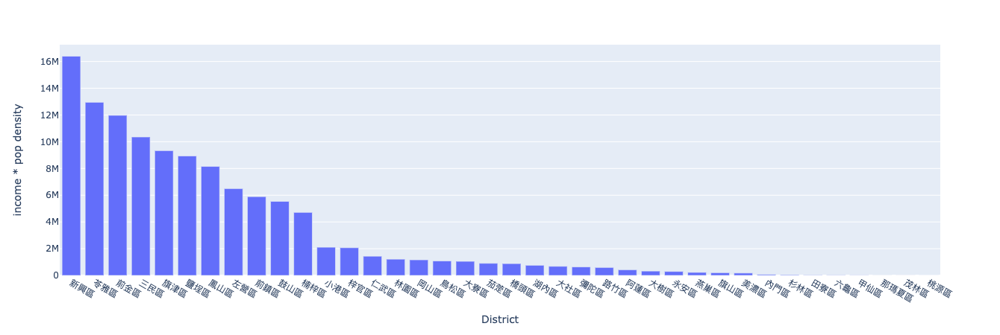

In [100]:
import plotly.express as px
fig = px.bar(df_main, x='District', y='income * pop density')
fig.show()

## Necessary information required by **Foursquare** API

In [101]:
CLIENT_ID = 'CYRKJGO1UOMYCBDU5EUJKMYXPDGS0SKRHAKAYPG4UTM4SOOC' # your Foursquare ID
CLIENT_SECRET = 'EHQ5XZMCNN2ELZJN5RCEFMC5LOKEEJUCIDKCAY22FZSRC0T2' # your Foursquare Secret
ACCESS_TOKEN = 'EKQFKVI01XTEHXFUTUHURDWV5N31J5KBFJQ1YNQEDVD1GF1W'
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)


Your credentails:
CLIENT_ID: CYRKJGO1UOMYCBDU5EUJKMYXPDGS0SKRHAKAYPG4UTM4SOOC
CLIENT_SECRET:EHQ5XZMCNN2ELZJN5RCEFMC5LOKEEJUCIDKCAY22FZSRC0T2


## Functions to get the mapping of Foursquare's categories and IDs

In [102]:
CategoryToID = {'name':[], 'id':[], 'level':[]}
def DFS(cur_cats, level):
    if isinstance(cur_cats, dict) == True:
        if 'categories' in cur_cats:
            DFS(cur_cats['categories'], level + 1)
    else:
        for e in cur_cats:
            name = e['name'].lower().replace('/', '')
            name = re.sub('  +' ,' ', name)
            CategoryToID['name'].append(name)
            CategoryToID['id'].append(e['id'])
            CategoryToID['level'].append(level)
            if 'categories' in e:
                DFS(e['categories'], level + 1)

def GetAllCategoryIDs():
    
    try:
        df_CategoryToID = pd.read_csv('CategoryID.csv')
        return df_CategoryToID
    except:
        url = "https://api.foursquare.com/v2/venues/categories?client_id={}&client_secret={}&v={}".format(
            CLIENT_ID, 
            CLIENT_SECRET,
            VERSION
        )
        all_categories = requests.get(url).json()['response']['categories']
        for cats in all_categories:
            name = cats['name'].lower().replace('/', '')
            name = re.sub('  +' ,' ', name)
            CategoryToID['name'].append(name)
            CategoryToID['id'].append(cats['id'])
            CategoryToID['level'].append(0)
            DFS(cats, 0)
        df_CategoryToID = pd.DataFrame(CategoryToID)
        return df_CategoryToID
df_CategoryToID = GetAllCategoryIDs()
df_CategoryToID.head()

,Unnamed: 0,name,id,level
0,0,arts & entertainment,4d4b7104d754a06370d81259,0
1,1,amphitheater,56aa371be4b08b9a8d5734db,1
2,2,aquarium,4fceea171983d5d06c3e9823,1
3,3,arcade,4bf58dd8d48988d1e1931735,1
4,4,art gallery,4bf58dd8d48988d1e2931735,1


## Function from lab to get nearby venues

In [103]:
def getNearbyVenues(names_d, names_n, latitudes, longitudes, radius=500):
    venues_list=[]
    for name_d, name_n, lat, lng in tqdm(zip(names_d, names_n, latitudes, longitudes)):
        name = name_d + name_n
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        results = requests.get(url).json()["response"]['groups'][0]['items']
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

## Get nearby venues of each neighborhood

In [104]:
try:
    kh_venues = pd.read_csv('DistrictNeighborhoodVenue_KH_v1.1.csv')
except:
    kh_venues = getNearbyVenues(names_d=df_location_dn['Districts'], names_n=df_location_dn['Neighborhoods'],
                                       latitudes=df_location_dn['lat'],
                                       longitudes=df_location_dn['lng']
                                      )
print(kh_venues.shape)
kh_venues.head()

(4369, 9)


,Unnamed: 0,District,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,楠梓區,清豐里,22.745355,120.329905,大眾羊肉,22.749278,120.330398,Asian Restaurant
1,1,楠梓區,東寧里,22.733572,120.329930,台糖量販楠梓店,22.736173,120.331014,Shopping Mall
2,2,楠梓區,東寧里,22.733572,120.329930,smallの萱,22.731524,120.327888,Restaurant
3,3,楠梓區,東寧里,22.733572,120.329930,廣東汕頭自製雞蛋麵,22.736191,120.332240,Soup Place
4,4,楠梓區,東寧里,22.733572,120.329930,85度C,22.729231,120.329793,Coffee Shop


## I would like to find a place where people care about their health(more than other places).
## Ideally, it should be some neighborhoods with top venues as **gym**/**fitness centers** or some **sport facilities**.
### So I do kmeans clustering on neighborhoods like we did in lab. 

In [105]:
# one hot encoding
kh_onehot = pd.get_dummies(kh_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
kh_onehot['Neighborhood'] = kh_venues['District'] + kh_venues['Neighborhood']

# move neighborhood column to the first column
fixed_columns = [kh_onehot.columns[-1]] + list(kh_onehot.columns[:-1])
kh_onehot = kh_onehot[fixed_columns]

kh_onehot.head()

kh_onehot_group = kh_onehot.groupby('Neighborhood').mean().reset_index()

print(kh_onehot_group.shape)
kh_onehot_group.head()

(603, 223)


,Neighborhood,Afghan Restaurant,Airport Terminal,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,...,Trail,Train Station,Tree,Tunnel,Udon Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Water Park,Zoo
0,三民區力行里,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.250000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,三民區十全里,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,三民區十美里,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,三民區千北里,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,三民區千歲里,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Do Kmeans clustering

In [106]:
# set number of clusters
kclusters = 30

dns = list(kh_onehot_group['Neighborhood'])
kh_clustering = kh_onehot_group.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(kh_clustering)
col_kmeans = 'KMeans Labels'
kh_clustering.insert(0, col_kmeans, kmeans.labels_)
kh_clustering.insert(0, 'Neighborhood', dns)

# check cluster labels generated for each row in the dataframe
kh_clustering.head()

,Neighborhood,KMeans Labels,Afghan Restaurant,Airport Terminal,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,...,Trail,Train Station,Tree,Tunnel,Udon Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Water Park,Zoo
0,三民區力行里,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,三民區十全里,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,三民區十美里,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,三民區千北里,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,三民區千歲里,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## We need to check:
1. If K value is good enough.
2. If we have such "healthy area".

## So I visualize the result of each group.

In [107]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.head(num_top_venues)
    #return row_categories_sorted.index.values[0:num_top_venues]

Group: 0


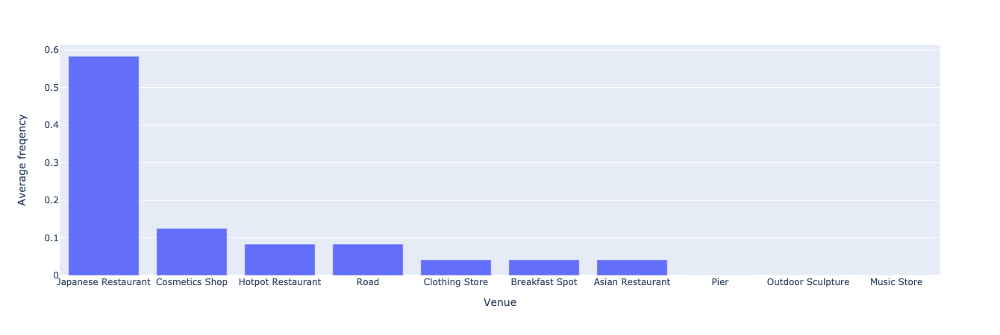

Group: 1


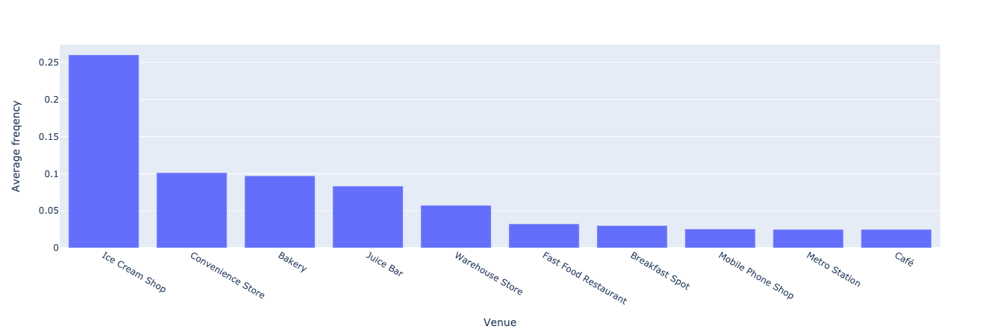

Group: 2


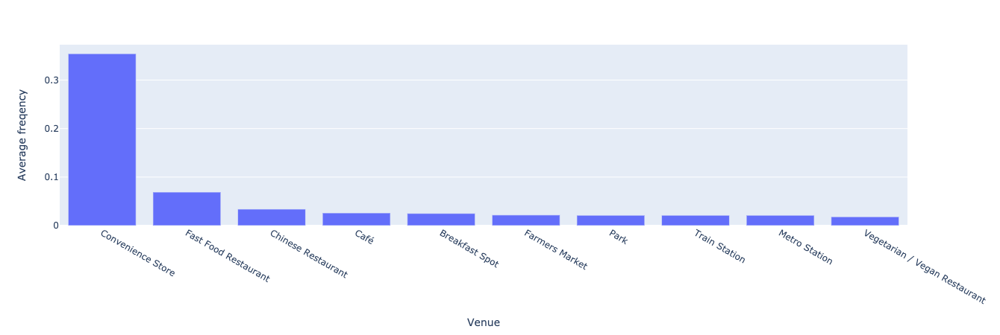

Group: 3


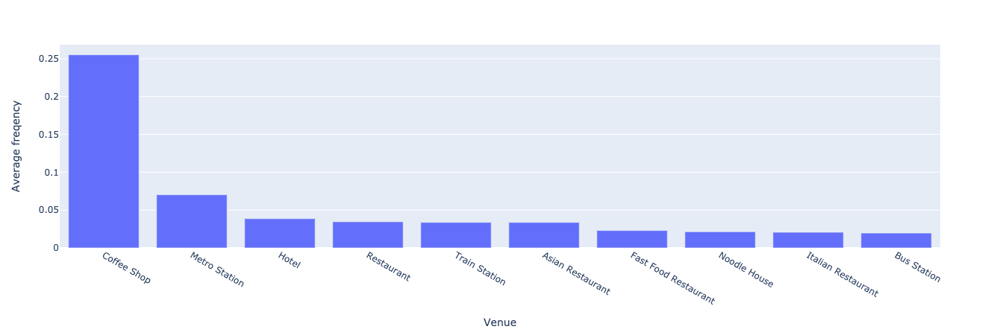

Group: 4


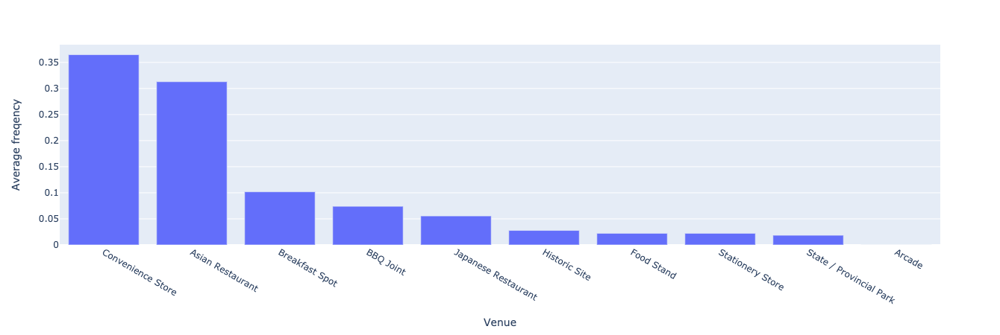

Group: 5


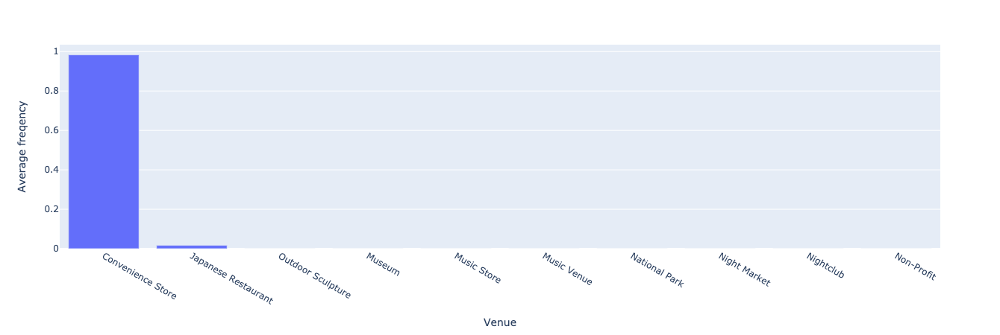

Group: 6


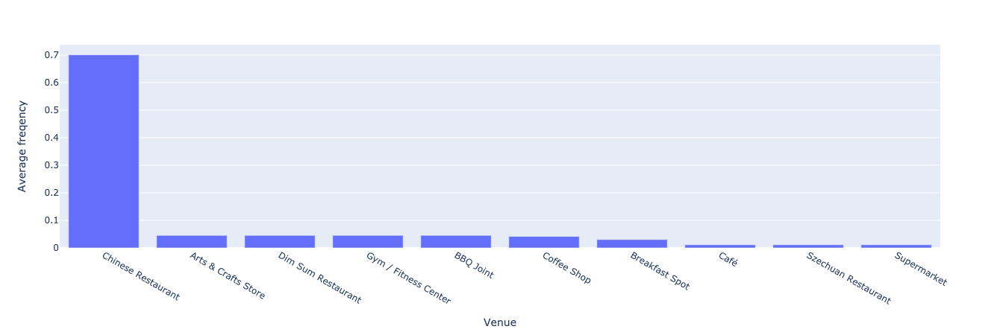

Group: 7


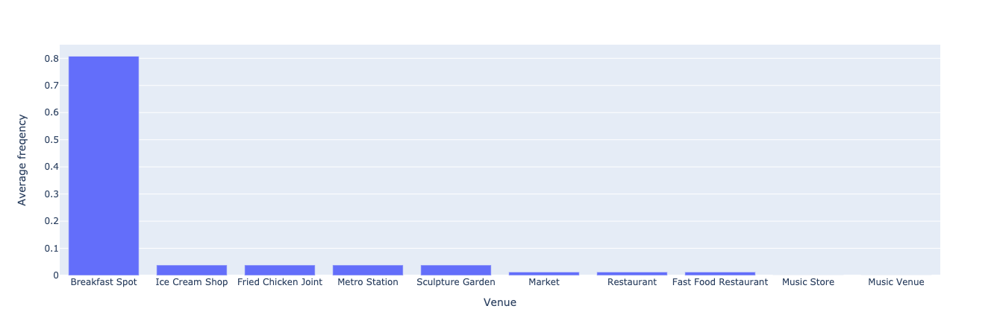

Group: 8


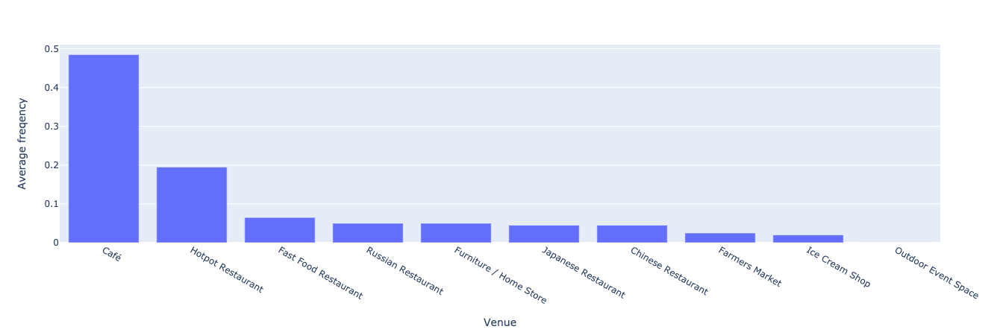

Group: 9


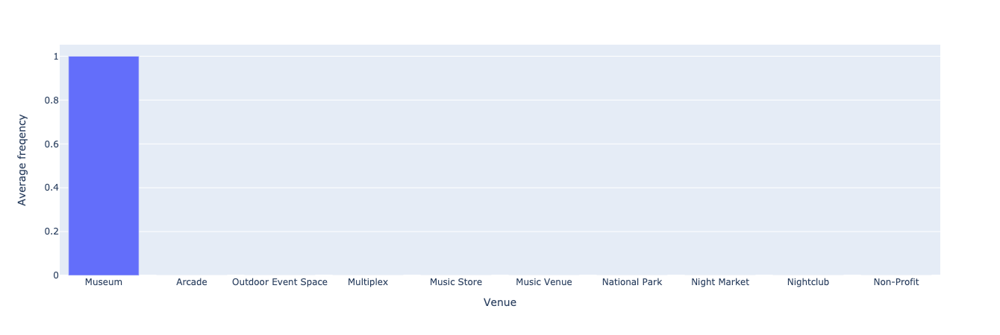

Group: 10


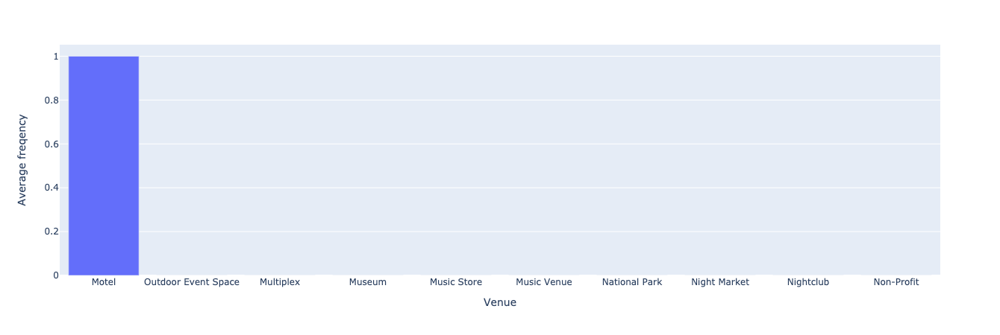

Group: 11


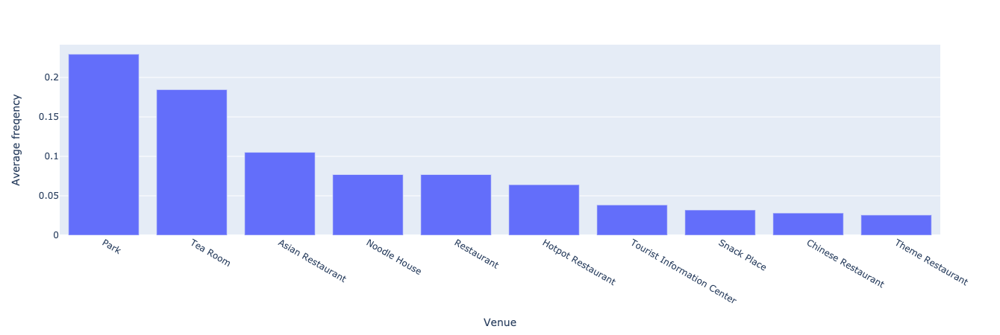

Group: 12


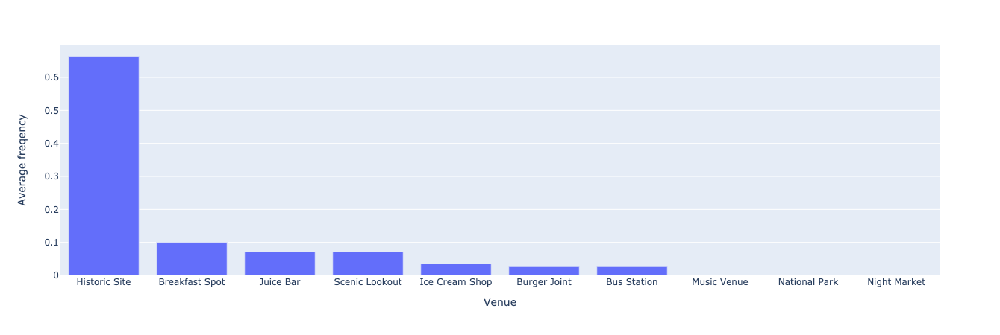

Group: 13


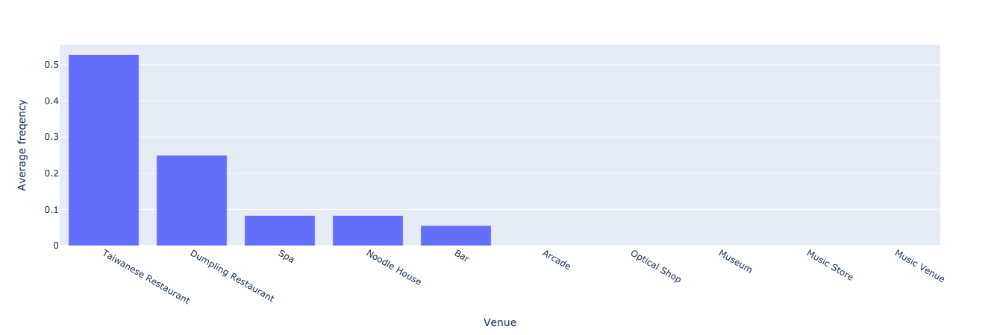

Group: 14


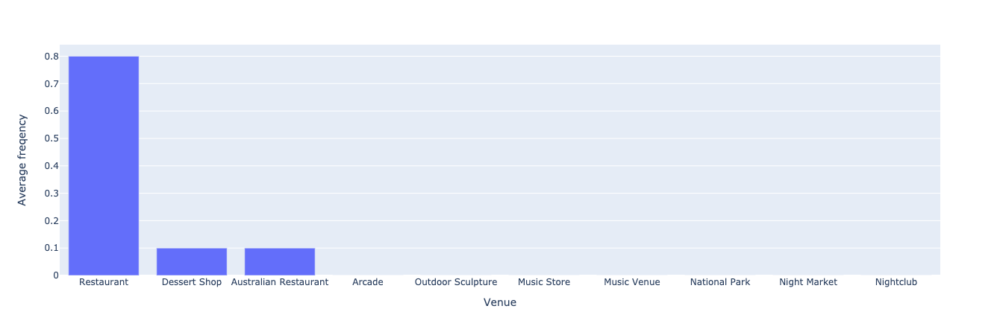

Group: 15


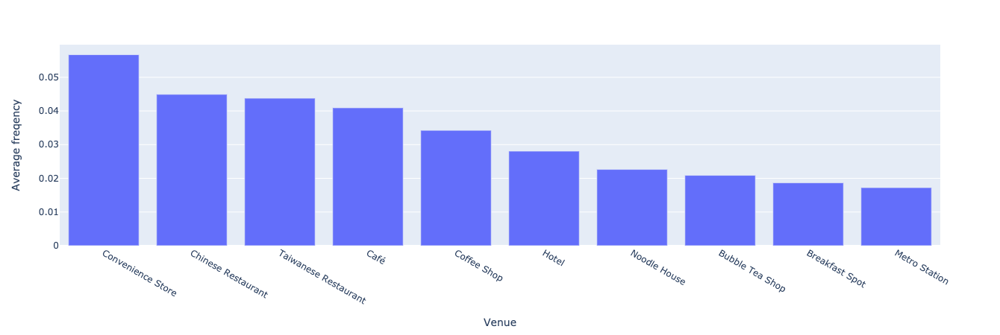

Group: 16


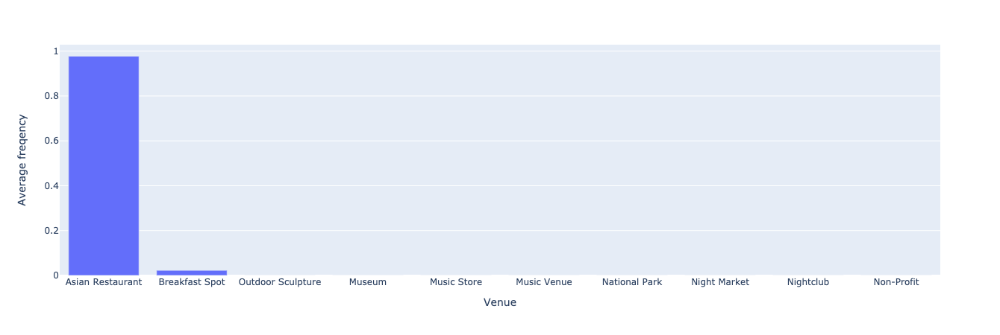

Group: 17


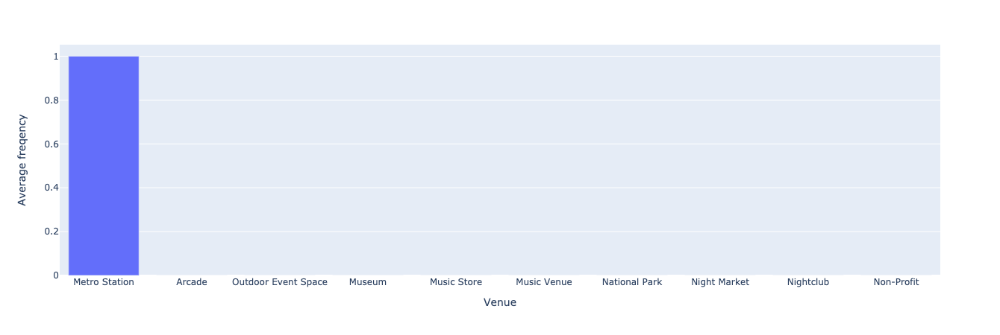

Group: 18


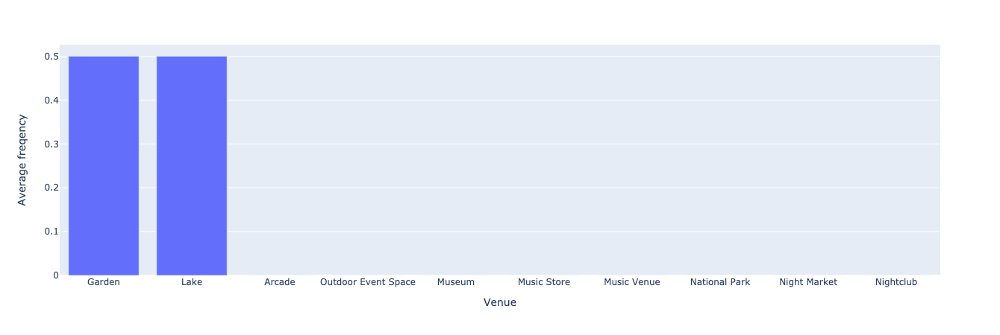

Group: 19


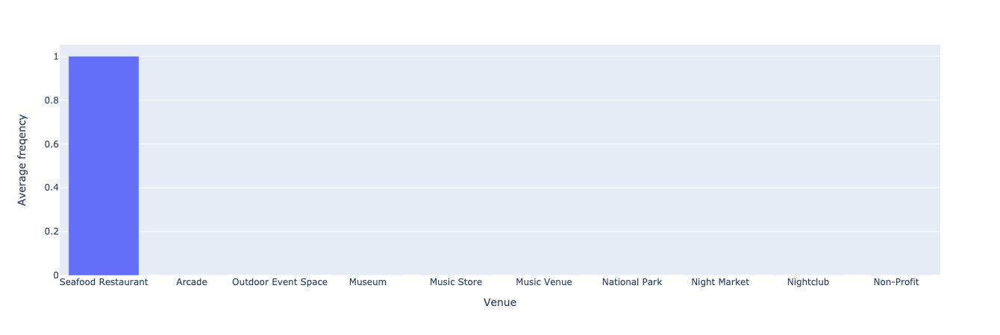

Group: 20


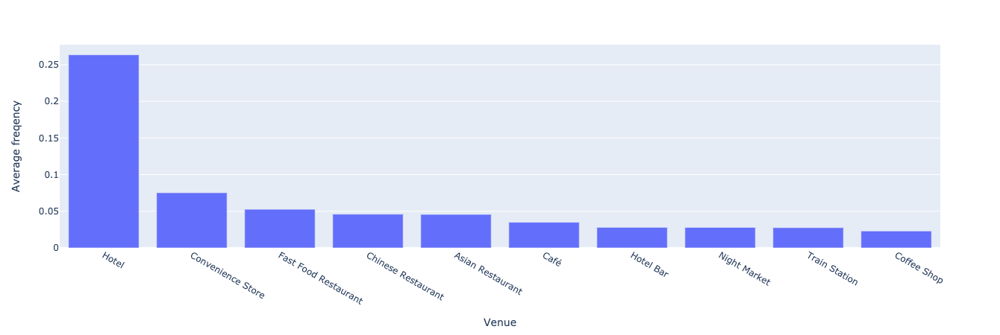

Group: 21


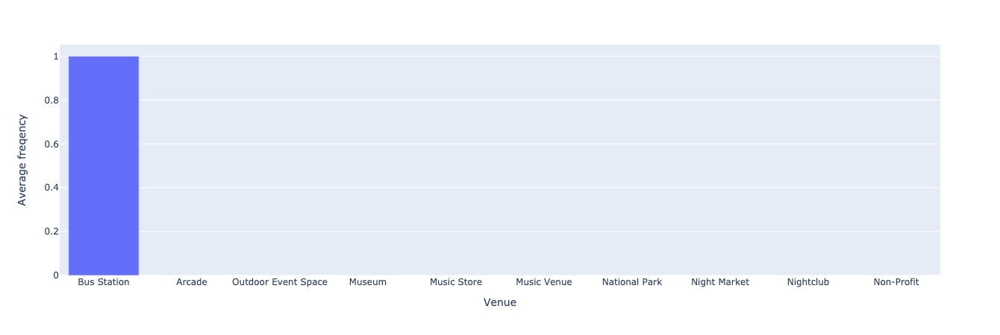

Group: 22


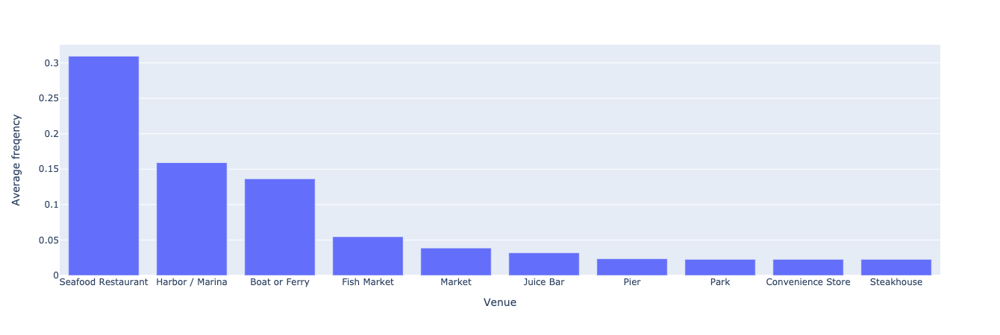

Group: 23


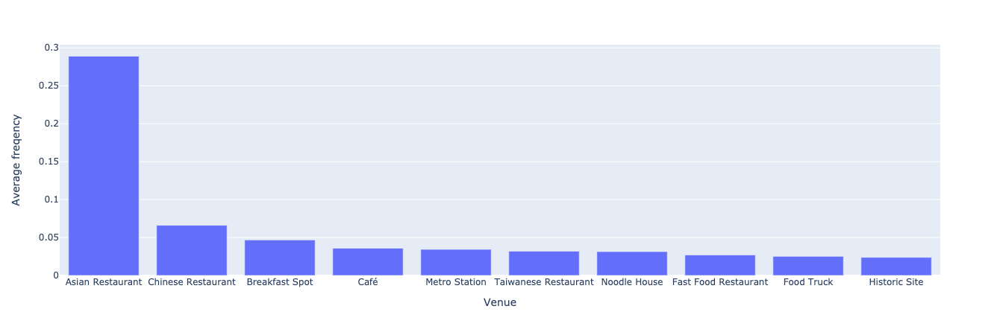

Group: 24


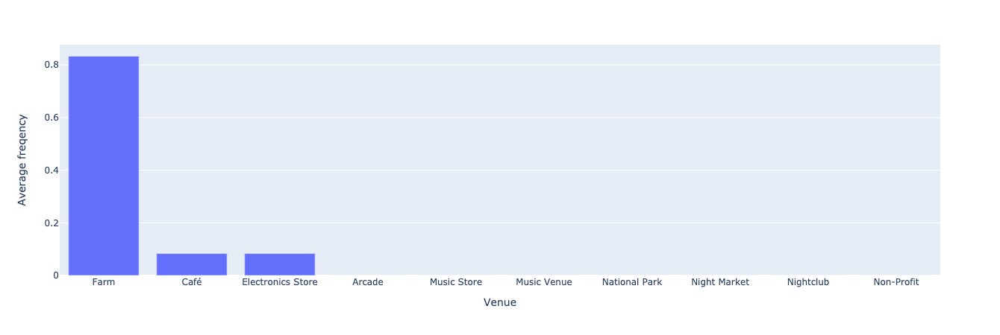

Group: 25


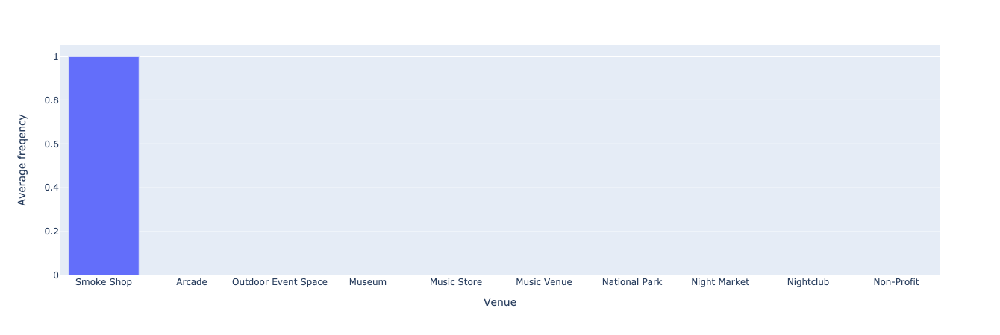

Group: 26


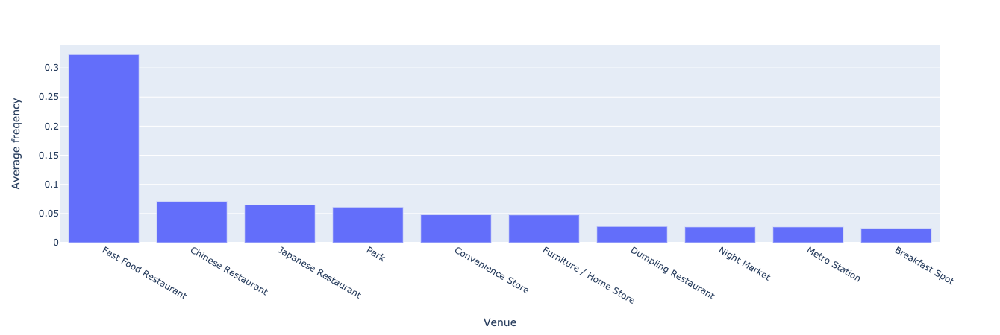

Group: 27


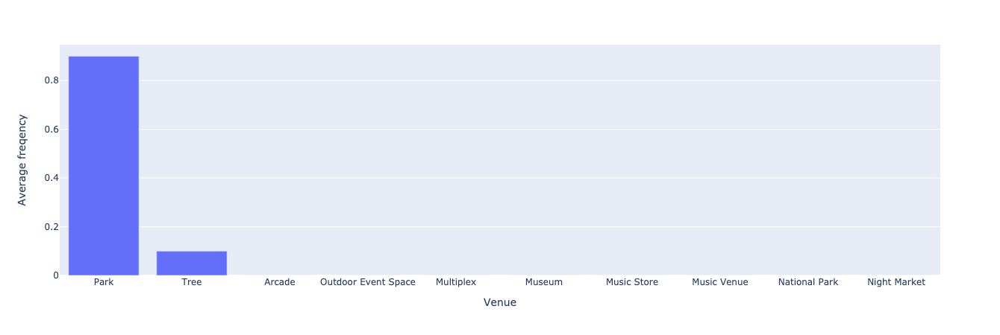

Group: 28


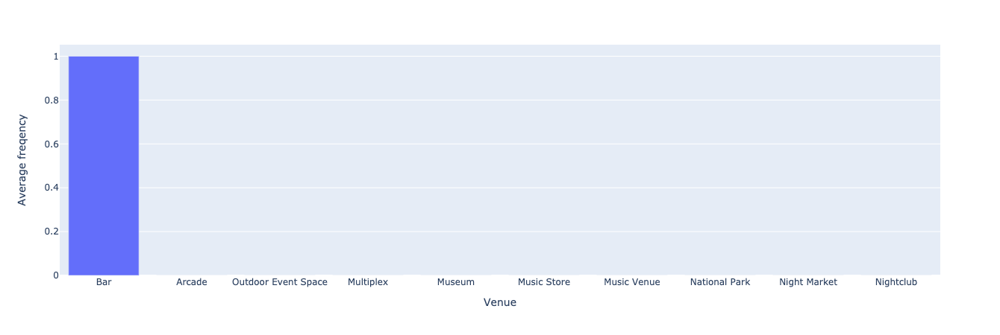

Group: 29


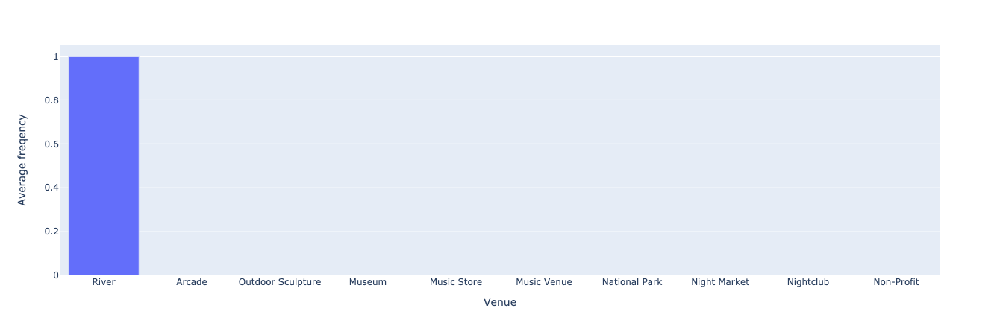

In [108]:
for i in range(kclusters):
    print('Group:', i)
    temp = kh_clustering.loc[kh_clustering['KMeans Labels'] == i, kh_clustering.columns[[1] + list(range(5, kh_clustering.shape[1]))]]
    temp2 = {}
    for col in temp.columns[1:]:
        temp2[col] = [sum(temp[col]) / len(temp.index)]
    temp2 = pd.DataFrame(temp2).T.reset_index()
    temp2.columns = ['Venue','Average freqency']
    temp2 = temp2.sort_values(by='Average freqency', ascending=False).head(10)
    fig = px.bar(temp2, x='Venue', y='Average freqency')
    fig.show()
    #break


## The trend I expect is **not** significant. But we do see some interesting groups:
1. Group 11 & 27 are *healthier* since their top venues are **"Park"**
2. Group 1, 25, 26 are *not so healthy* since their top venues are **Ice Cream Shop**, **Smoke Shop** and **Fast Food Restaurant** respectively.

## Mark *not-healthy* groups on the map

In [118]:
kh_clustering_location = kh_clustering.join(df_location_dn.set_index('DNs'), on='Neighborhood')
kh_clustering_location.head()

location = geolocator.geocode('高雄市, 台灣')
lat_kh = location.latitude
lng_kh = location.longitude

# create map
map_clusters = folium.Map(location=[lat_kh, lng_kh], zoom_start=12)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
focus = set([1,11,17,25,26])
# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(kh_clustering_location['lat'], kh_clustering_location['lng'], kh_clustering_location['Neighborhood'], kh_clustering_location['KMeans Labels']):
    if cluster not in focus:
        continue
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    if str(cluster) == 'nan':
        continue
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## People around above places like *not-healthy* food more than heathy food. So I had better to avoid them.

## I believe people around certain kinds of venues will be my potential customer.

### Functions to get venues around a place by **category ID**.

In [119]:
def GetVenuesBySerial(names, latitudes, longitudes, cat_in):
    cat_id = list(df_CategoryToID[df_CategoryToID['name']==cat_in]['id'])[0]
    print('id of {} is {}'.format(cat_in, cat_id))
    dict_gyms = {'id':[], 'name':[], 'lat':[], 'lng':[], 'category':[]}
    all_gym_ids = set()
    for name, lat, lng in tqdm(zip(names, latitudes, longitudes)):
        url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            cat_id)
        response = requests.get(url).json()["response"]
        cols = ['id', 'name', 'lat', 'lng', 'category']     
        for v in response['venues']:
            an_id = v['id']
            if an_id not in all_gym_ids:
                all_gym_ids.add(an_id)
                dict_gyms['id'].append(an_id)
                dict_gyms['name'].append(v['name'])
                dict_gyms['lat'].append(v['location']['lat'])
                dict_gyms['lng'].append(v['location']['lng'])
                dict_gyms['category'].append(v['categories'][0]['name'])
            else:
                pass
    df_gyms = pd.DataFrame(dict_gyms)
    print(df_gyms)
    df_gyms.to_csv('Locations_%s.csv' % cat_in)
    return df_gyms

def GetDfOfCertainVenueLocations(centers, lats, lngs, category):
    try:
        df_certain_cat = pd.read_csv('Locations_%s.csv' % category)
    except:
        print('Plan to search [{}] around [{}] places'.format(category, len(centers)))
        df_certain_cat = GetVenuesBySerial(df_main[col_districts], df_main['lat'], df_main['lng'], category)
    return df_certain_cat
    

## **Public transportation** will help my business a lot.
### So I search for **travel & transport** venues first

In [120]:
df_TravelTransport = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'travel & transport')
df_TravelTransport.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,4bd3e87bb221c9b63cd8dad0,捷運文化中心站 KMRT Cultural Center Station (O7),22.630186,120.317942,Metro Station
1,1,4be1fd81edbb0f472e70a715,Formosa Blvd. Station (O5/R10) (捷運美麗島站 KMRT Fo...,22.629932,120.303545,Metro Station
2,2,4c5bd760bfa5952176bc69ff,THSR Tainan Station (高鐵台南站),22.924633,120.285760,Train Station
3,3,4b62c457f964a520d9512ae3,THSR Zuoying Station (高鐵左營站),22.687073,120.307943,Train Station
4,4,606c23fb99fa866dc08aff2d,Youbike Zhongshan Wufu Rd. Intersection (North...,22.623463,120.300877,Bike Rental / Bike Share


## But there are some venues categories which are not related to my topic like "hotel".
## So instead I search for **metro**/**bus**/**train** venues.

In [121]:
df_MetroStation = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'metro station')
df_MetroStation.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,4d50d1709d493704f124c639,高雄捷運信義國小站 (O6),22.630759,120.311353,Metro Station
1,1,4be1fd81edbb0f472e70a715,Formosa Blvd. Station (O5/R10) (捷運美麗島站 KMRT Fo...,22.629932,120.303545,Metro Station
2,2,4bdc2205c79cc928864c85e9,捷運小港站 KMRT Siaogang Station (R3),22.565062,120.353631,Metro Station
3,3,4bdad6fec79cc928bae77fe9,捷運世運/國家體育園區站 KMRT World Games / National Sport...,22.701683,120.302526,Metro Station
4,4,4bdabf4c3904a593c52d479e,捷運橋頭糖廠站 KMRT Ciaotou Sugar Refinery Station (R...,22.753355,120.314596,Metro Station


In [122]:
df_TrainStation = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'train station')
df_TrainStation.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,5db81046e5f99900080d6018,KMRT Formosa Boulevard Station Orange Line Pla...,22.631245,120.303380,Platform
1,1,4c5bd760bfa5952176bc69ff,THSR Tainan Station (高鐵台南站),22.924633,120.285760,Train Station
2,2,4b62c457f964a520d9512ae3,THSR Zuoying Station (高鐵左營站),22.687073,120.307943,Train Station
3,3,5c2d568e0d2be7002c6bdebf,TRA Kaohsiung Sta. Platform 1A (臺鐵高雄車站1A月台),22.639855,120.302257,Platform
4,4,5c2daa7e3abcaf002c886e6f,TRA Kaohsiung Sta. Platform 2A (臺鐵高雄車站2A月台),22.639534,120.302552,Platform


In [123]:
df_BusStation = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'bus station')
df_BusStation.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,4cb992924352a1cd8e228df5,和欣客運 建國站,22.637665,120.304219,Bus Station
1,1,4d025b553be26dcb532b78e4,統聯客運,22.628203,120.331766,Bus Station
2,2,58314d510bc55b33a54b70f0,南崗山轉運站,22.780470,120.300800,Bus Station
3,3,532ebde211d2754d009bdeca,國道客運候車亭,22.628113,120.331801,Bus Station
4,4,5c26982c610f04002be8d64f,屏東轉運站,22.669732,120.485113,Bus Station


In [124]:
df_BusStop = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'bus stop')
df_BusStop.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,5b03e68ebfc6d0002c6e1d98,公車南台路口站,22.631100,120.300699,Bus Stop
1,1,5a3c7a29610f0447484ec0c2,高鐵台南站接駁車站,22.923926,120.285771,Bus Stop
2,2,5ce3b0aa60d11b002cfbda26,LRT Software Park Sta. Stop (公車輕軌軟體園區站),22.604855,120.301238,Bus Stop
3,3,55d5a722498e443227cb63ce,公車國際商場站 Bus International Market Sta.,22.625271,120.281723,Bus Stop
4,4,5b15d7e6dff815002c3090a7,高雄客運建國站,22.637767,120.300307,Bus Stop


## I also believe that the customers of **healthy food** and **low GI food** like **fitness**/**sport** as well.

In [125]:
df_GymFit = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'gym fitness center')
df_GymFit.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,502a3b1be4b0f6fce31cf5d9,25F Gym,22.626299,120.307989,Gym
1,1,5dc6b5dcd19331000799a06e,Anytime Fitness 高雄左營高鐵店24小時健身房,22.681988,120.311380,Gym / Fitness Center
2,2,528c48a811d2ea3e14ceabe2,健身工廠 五福廠 Fitness Factory Wufu,22.623357,120.301562,Gym
3,3,5e3d774a9b92a90008c4d914,World Gym世界健身俱樂部 高雄文衡店Express,22.641216,120.349410,Gym / Fitness Center
4,4,5069a01ce4b007c938acc05f,自然呼吸,22.619298,120.317418,Yoga Studio


In [126]:
df_Sport = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'athletics & sports')
df_Sport.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,502a3b1be4b0f6fce31cf5d9,25F Gym,22.626299,120.307989,Gym
1,1,4ba37096f964a520273d38e3,凹子底森林公園,22.658769,120.299892,Park
2,2,5069a01ce4b007c938acc05f,自然呼吸,22.619298,120.317418,Yoga Studio
3,3,5dc6b5dcd19331000799a06e,Anytime Fitness 高雄左營高鐵店24小時健身房,22.681988,120.311380,Gym / Fitness Center
4,4,5e3d774a9b92a90008c4d914,World Gym世界健身俱樂部 高雄文衡店Express,22.641216,120.349410,Gym / Fitness Center


## I need to check for other **restaurants** as well since I don't want too many competitors around.

In [127]:
df_Food = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'food')
df_Food.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,4bc500da910eeee18b3dbbe6,福華大飯店,22.633886,120.308136,Hotel
1,1,5f8685e980e1420131c14ed6,廣城自助餐（重愛店）,22.685262,120.315930,Deli / Bodega
2,2,521345237e48ed6dd080bdc1,宜家家居餐廳 IKEA Food and Restaurant KaoHsiung,22.606198,120.304338,Scandinavian Restaurant
3,3,605acb04695f896a845834ce,Pokelee,22.658972,120.292250,Hawaiian Restaurant
4,4,6069b3ed31dd1376bcbe5db2,白色戀人貨櫃屋,22.625398,120.289901,Café


## Actually there is **no** healthy food restaurant around.

In [128]:
len(df_Food[df_Food['category'].str.contains('eal')])

0

## From my personal experience, certain people are more likely to be interesting in healthy food, too.
1. Bank workers
2. School teachers
3. People who go to hospital very often.

## So I also search for **banks**, **schools** and **hospitals**.

In [129]:
df_Bank = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'bank')
df_Bank.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,5f8f9590c57a9d60c3873bd0,BNP Paribas (法國巴黎銀行),22.630723,120.312901,Bank
1,1,4cf878cb4464b60cddbf60f8,中華郵政,22.631008,120.303780,Post Office
2,2,4d8c4e3b3753548130e54e56,DBS Bank - Siwei Branch (星展銀行 四維分行),22.619663,120.311455,Bank
3,3,4ff53685e4b07fe945580bec,渣打銀行 Standard Chartered,22.666131,120.302790,Bank
4,4,5326d626498e93d1cd9bc2df,The Kaohsiung Third Credit Co-Operative (高雄市第三...,22.620725,120.271568,Credit Union


In [80]:
df_School = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'school')
df_School.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,4f0fa9f2e4b067f66dd57f04,四維國小,22.622713,120.313873,School
1,1,604f15426cc8de66e148d045,求精外語留學機構,22.636416,120.302175,Language School
2,2,582fc4cb2c55ec662d829ae8,天主教高雄市私立樂仁幼兒園,22.620440,120.291466,Preschool
3,3,4edc67517ee5e8e3e93b1b61,中華電信訓練所高雄分所,22.672149,120.349499,School
4,4,532d20c6498e1b8bd5057017,仙吉國小,22.544550,120.460800,Elementary School


In [81]:
df_Hospital = GetDfOfCertainVenueLocations(df_main[col_districts],df_main['lat'], df_main['lng'], 'hospital')
df_Hospital.head()

,Unnamed: 0,id,name,lat,lng,category
0,0,5081087de4b0f51bc54920a2,原祿骨外科醫院,22.630964,120.309079,Hospital
1,1,4cca6cc7c010f04d8223efcc,義大醫院,22.765471,120.364192,Hospital
2,2,4ebc8f6061af9815e0c6d89d,高雄長庚紀念醫院,22.491579,120.539122,Hospital
3,3,4e27ad788877f9158a6de386,Kaohsiung Municipal Minsheng Hospital (高雄市立民生醫院),22.626301,120.324004,Hospital
4,4,4dfc1a1fd164848a03f4b4dd,阮綜合醫院 Yuan's General Hospital,22.615437,120.297568,Hospital


## Then I visualize all above venues to the map.

### **income * pop density** is visualized as golden circles. The bigger a circle is, the larger **income * pop density** the district has.

In [130]:
map_kh = AddDfPointsToNewMap(lat_kh, lng_kh, df_main, col_districts, 'lat', 'lng', 'gold', 'circle', ('income * pop density', 2000000))

### Different kinds of venues have different icons

In [131]:
map_kh = AddDfPointsToExistMap(map_kh, df_BusStop, 'name', 'lat', 'lng', 'orange', 'bus', scale=None)
map_kh = AddDfPointsToExistMap(map_kh, df_TrainStation, 'name', 'lat', 'lng', 'blue', 'train', scale=None)
map_kh = AddDfPointsToExistMap(map_kh, df_MetroStation, 'name', 'lat', 'lng', 'purple', 'subway', scale=None)
map_kh = AddDfPointsToExistMap(map_kh, df_Bank, 'name', 'lat', 'lng', 'pink', 'usd', scale=None)
map_kh = AddDfPointsToExistMap(map_kh, df_GymFit, 'name', 'lat', 'lng', 'red', 'heartbeat', scale=None)
map_kh = AddDfPointsToExistMap(map_kh, df_Sport, 'name', 'lat', 'lng', 'red', 'soccer-ball-o', scale=None)
map_kh = AddDfPointsToExistMap(map_kh, df_Food, 'name', 'lat', 'lng', 'green', 'cutlery', scale=None)
map_kh = AddDfPointsToExistMap(map_kh, df_School, 'name', 'lat', 'lng', 'black', 'book', scale=None)
map_kh = AddDfPointsToExistMap(map_kh, df_Hospital, 'name', 'lat', 'lng', 'red', 'medkit', scale=None)
map_kh

### If the map doesn't show up. Please refer to my report.

## As you can see in the map, top 3 districts ordered by **income * pop density**(新興區, 苓雅區, and 前金區) are close to each other.
## It would be good to start from here.

In [91]:
map_kh

### If the map doesn't show up. Please refer to my report.

## By visual inspection, I choose to locate my restaurant around this **cycle**/**roundabout**

## This place has several advantages:
### - Residents: **Income median** here is higher than other districts. And so is the **population density**.
### - Environment:
1. A **metro station** is very close.(convenience)
2. In around 300m, there are several **banks**(potential customers 1)
3. In around 500m, there are two **fitness centers**(potential customers 2)
4. In around 1 km, there are two **elementary schools**(potential customers 3)
5. In around 1 km, there is one **hospital**(potential customers 4)

In [92]:
map_kh

### If the map doesn't show up. Please refer to my report.